In [157]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import pickle
import os

In [177]:
#STEP 1: Which file to visualize network reconstruction

DATASET_ID = "lx599"
state = "UTb"
frac_cells = 0.1

In [178]:
#STEP 1+: file path way
DATA_FOLDERNAME = "/home/linl5/project/SCLC/data/{}".format(DATASET_ID)
REGULONS_FNAME = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.p'.format(DATASET_ID, state, frac_cells))
FIGURE_FOLDERNAME = "/home/linl5/project/SCLC/figures/{}".format(DATASET_ID)
REGULON_DF_FILE = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.csv'.format(DATASET_ID, state, frac_cells))

In [179]:
#STEP 2: reading regulon files
with open(REGULONS_FNAME, 'rb') as f:
    regulons = pickle.load(f)

In [180]:
#STEP 3: converting regulon .p into df
# Initialize an empty list to store the rows of the new DataFrame
rows = []

# Loop through each regulon object in the list
for regulon in regulons:
    regulon_name = regulon.name
    transcription_factor = regulon.transcription_factor
    context = regulon.context
    score = regulon.score
    orthologous_identity = regulon.orthologous_identity
    similarity_qvalue = regulon.similarity_qvalue
    annotation = regulon.annotation
    nes = regulon.nes
    
    
    # Loop through each gene in the regulon and extract gene-target pairs
    for gene, weight in regulon.gene2weight.items():
        row = {
            'Regulon_Name': regulon_name,
            'Transcription_Factor': transcription_factor,
            'Context': context,
            'Target_Gene': gene,
            'Weight': weight,
            'Scores': score,
            'nes': nes,
            'orthologous_identity': orthologous_identity,
            'similarity_qvalue': similarity_qvalue, 
            'annotation': annotation
        }
        rows.append(row)

# Create a new DataFrame from the list of rows
regulon_df = pd.DataFrame(rows)
# writing to csv
regulon_df.to_csv(REGULON_DF_FILE, index=False, sep='\t')
print("Successful Writing:", REGULON_DF_FILE)
# visualizing df
regulon_df

Successful Writing: /home/linl5/project/SCLC/data/lx599/lx599.UTb.0.1.regulons.csv


,Regulon_Name,Transcription_Factor,Context,Target_Gene,Weight,Scores,nes,orthologous_identity,similarity_qvalue,annotation
0,ASCL1(+),ASCL1,"(activating, flyfactorsurvey__wor_SOLEXA_2.5_F...",ATOH7,2.043387,0.145005,0.0,0.0,0.0,
1,ASCL1(+),ASCL1,"(activating, flyfactorsurvey__wor_SOLEXA_2.5_F...",NR0B2,28.405013,0.145005,0.0,0.0,0.0,
2,ASCL1(+),ASCL1,"(activating, flyfactorsurvey__wor_SOLEXA_2.5_F...",TUBB2B,25.467062,0.145005,0.0,0.0,0.0,
3,ASCL1(+),ASCL1,"(activating, flyfactorsurvey__wor_SOLEXA_2.5_F...",SCG2,15.915912,0.145005,0.0,0.0,0.0,
4,ASCL1(+),ASCL1,"(activating, flyfactorsurvey__wor_SOLEXA_2.5_F...",ZBTB7C,37.049988,0.145005,0.0,0.0,0.0,
...,...,...,...,...,...,...,...,...,...,...
3331,THRB(+),THRB,"(hocomoco__NR1H4_HUMAN.H11MO.0.B.png, activating)",SLC34A2,7.293169,0.219252,0.0,0.0,0.0,
3332,THRB(+),THRB,"(hocomoco__NR1H4_HUMAN.H11MO.0.B.png, activating)",AXL,2.659290,0.219252,0.0,0.0,0.0,
3333,THRB(+),THRB,"(hocomoco__NR1H4_HUMAN.H11MO.0.B.png, activating)",WNT5B,3.318403,0.219252,0.0,0.0,0.0,
3334,THRB(+),THRB,"(hocomoco__NR1H4_HUMAN.H11MO.0.B.png, activating)",ALPL,8.149627,0.219252,0.0,0.0,0.0,


In [162]:
# STEP 5: List of TFs

regulon_df['Transcription_Factor'].unique().tolist()


['ADARB1',
 'ATF5',
 'ATOH7',
 'BHLHE40',
 'CUX2',
 'DDIT3',
 'DDX4',
 'E2F8',
 'EGR3',
 'EGR4',
 'ETV4',
 'FOS',
 'FOXA2',
 'FOXC1',
 'FOXO1',
 'HES1',
 'HMGA2',
 'HNF1A',
 'IKZF2',
 'JDP2',
 'JUNB',
 'KLF2',
 'LEF1',
 'MEF2C',
 'MEIS2',
 'MEOX2',
 'MYC',
 'NFATC1',
 'NOTO',
 'NR2F1',
 'PGR',
 'RFX2',
 'RUNX3',
 'SMAD3',
 'SOX4',
 'TBX15',
 'TCF7L1',
 'TCF7L2',
 'THRB']

SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx599/lx599.UUb.FULL_NETWORK.CELL_FRACTION_0.1.png


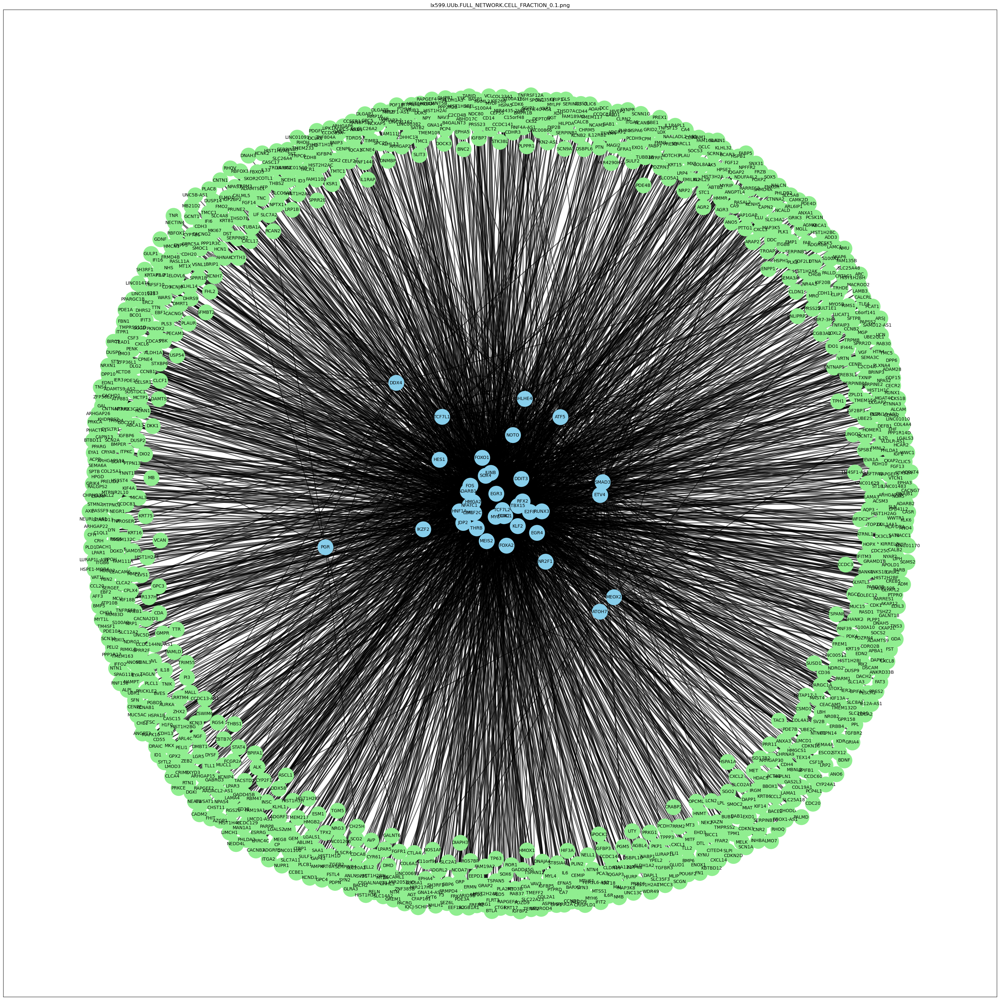

In [163]:
# NETWORK ANALYSIS 1: CREATING FULL NETWORKS BASED ON IMPORTANT TF

# Create a MultiDiGraph for SIGNIFICANT TF
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = regulon_df['Target_Gene'].unique().tolist()
tf_list = regulon_df['Transcription_Factor'].unique().tolist()

# Add nodes with 'node_type' attribute
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 40))
pos = nx.spring_layout(grn, seed = 1)

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.FULL_NETWORK.CELL_FRACTION_{}.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


In [164]:
# NETWORK ANALYSIS 2: CREATING NETOWORKS BASED ON IMPORTANT TF

count = 0

#import in list of important TF
imp_TF = ("NEUROD1", "ASCL1", "POU3F2", "YAP1", "FOXA2", "PLCG2", "NOTCH1")
rows = []

# Loop through each regulon object in the list and subselect for only important tf
for regulon in regulons:
    regulon_name = regulon.name
    transcription_factor = regulon.transcription_factor
    context = regulon.context
    score = regulon.score
    
    # Loop through each gene in the regulon and extract gene-target pairs
    for gene, weight in regulon.gene2weight.items():
        row = {
            'Regulon_Name': regulon_name,
            'Transcription_Factor': transcription_factor,
            'Context': context,
            'Target_Gene': gene,
            'Weight': weight,
            'Scores': score,
        }
        if row['Transcription_Factor'] in imp_TF:
            rows.append(row)

# Create a new DataFrame from the list of rows
sig_regulon_df = pd.DataFrame(rows)
print(DATASET_ID, state, frac_cells, "has following significant TF:", sig_regulon_df['Transcription_Factor'].unique().tolist() )


lx599 UUb 0.1 has following significant TF: ['FOXA2']


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx599/lx599.UUb.IMPORTANT_TF.CELL_FRACTION_0.1.aligned.png


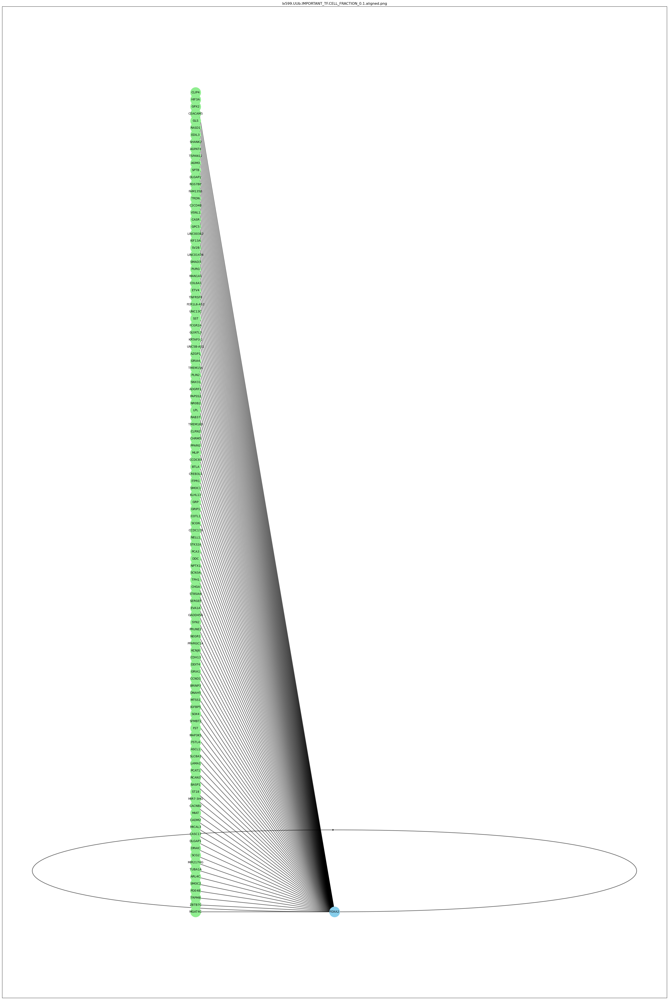

In [167]:
# Create a MultiDiGraph for SIGNIFICANT TF
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = sig_regulon_df['Target_Gene'].unique().tolist()
tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in sig_regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 60))

# Create positions for TG nodes in the middle
tg_positions = {node: (0, i) for i, node in enumerate(tg_nodes)}

# Create positions for TF nodes on the right and left sides
position = -1
tf_positions = {
    node: ((position ** i) * 2, (i * i) % 40) 
    for i, node in enumerate(tf_nodes)
}

# Combine the positions
pos = {**tg_positions, **tf_positions}

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.IMPORTANT_TF.CELL_FRACTION_{}.aligned.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx599/lx599.UUb.IMPORTANT_TF.CELL_FRACTION_0.1.random.png


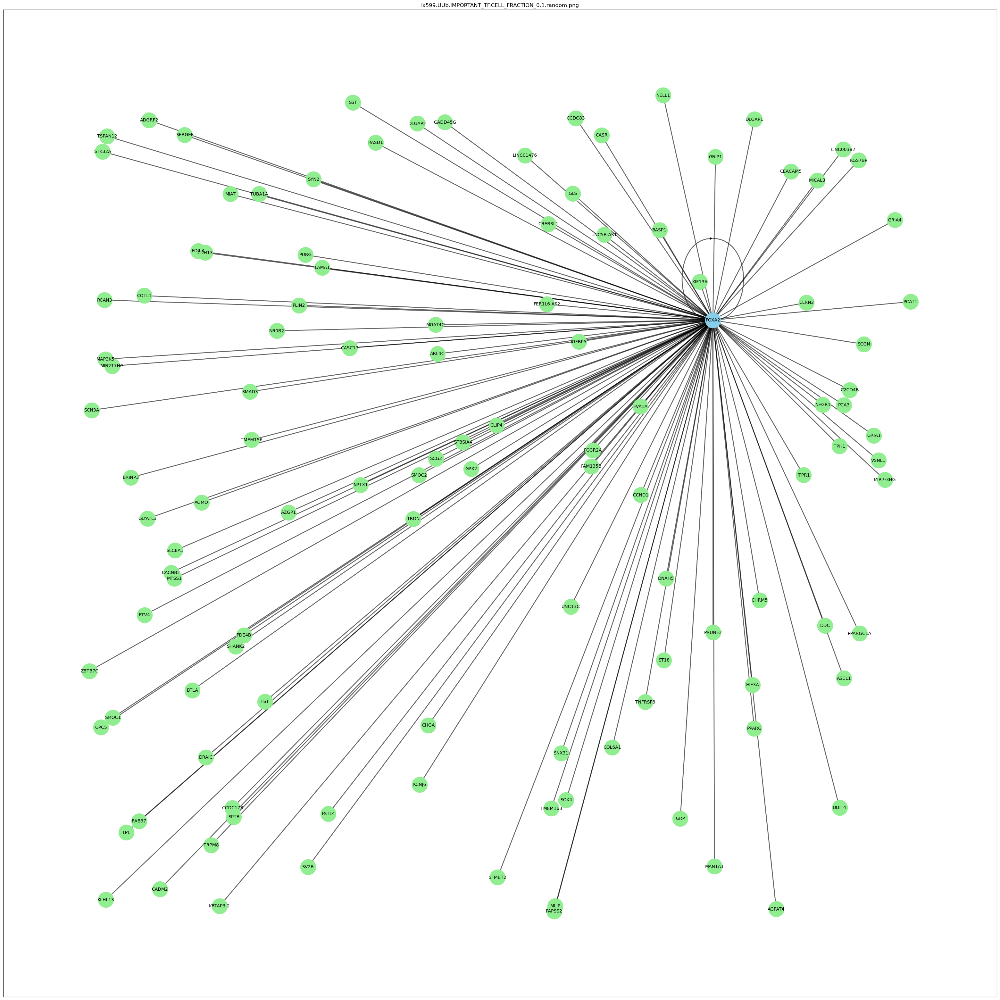

In [168]:
# Create a MultiDiGraph for SIGNIFICANT TF
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = sig_regulon_df['Target_Gene'].unique().tolist()
tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in sig_regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 40))
pos = nx.random_layout(grn, seed = 1)

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.IMPORTANT_TF.CELL_FRACTION_{}.random.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)
